# Predicting Manually Interpreted Parameters from Well Log Measurements

---

---
## Contents
1. [Introduction](#Introduction)
2. [Data Preparation](#Data-Preparation)
3. [Train/Test/Predict using TPOT](#Train/Test/Predict-using-TPOT)
4. [QC the results](#QC-the-results)

---
## Introduction

This notebook demonstrates the use of AutoML/ Genetic Algorithm method (TPOT) to train and test regression and classification models for prediction of missing curves in multiple wells, from other well log measurements. More information about TPOT method can be found at https://epistasislab.github.io/tpot/.


The training dataset is log data from 50 wells, with 8 wireline log measurements:

- Gamma ray (GR)
- Caliper (CALI)
- Resistivity logging (DRES)
- Photoelectric effect (PE)
- Neutron-Porosity (NPSS)
- Density (RHOB)
- Compressional Sonic (DT)
- Spontaneous Potential (SP)

and some interpreted curves coming from log measurements, core data and Image-Pro processing:

- Facies (FACIES_LUMPED_MODIFIED_AIB_1_5)
- % Clasts (IP_CLST)
- % Interbed (IP_IB)
- % Shale (IP_VSH)
- Effective Porosity (PHIT_CLIP_ED)
- Oil saturation (SO_CALC_OVS)
- Water saturation (SWT_CLIP_ED_OVS)
- Bitumen saturation (S_W3_CLIP)
- Zone (ZONELOGLINKEDTO'COLLABORATIVE_CLW_STRAT_2017)

There are 12 test wells in this study. All of these 12 wells are missing the curves listed in the second category listed above. This notebook build models for each missing parameter (in case of this dataset, 9 parameters). Each model is saved in the end as a pickle file as well as .py. Results of prediction are saved in .csv format.

Here we will provide the list of required libraries and also functions required to run this application:

In [1]:
import warnings
warnings.filterwarnings("ignore")
from math import sqrt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import math
import random
import pickle
from scipy import interpolate
from matplotlib.pyplot import cm
from matplotlib import style
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.metrics import f1_score
from scipy.signal import medfilt
import copy
import itertools


style.use('ggplot')
%matplotlib inline

If running on Sagemkaer, you will need to install these libraries. The rest of the libraries are already installed on any Sagemaker instance.

In [2]:
# !pip install lasio
# !pip install tpot
# !pip install xgboost


Load the new libraries as well.

In [3]:
import lasio
from tpot import TPOTRegressor
from tpot import TPOTClassifier
import UC3_Functions as uc3
from xgboost.sklearn import  XGBRegressor 
import xgboost as xgb
from xgboost import plot_importance

## Data Preparation

Here we will read LAS files from 50 and 12 wells, as well as the 5 test wells. We will also select data for each well only inside the interval of interest. These interval info was provided by ExxonMobil. 

In [4]:
path = r'/50 wells/well logs'
data50 = uc3.ReadAllLasFile(path, plot = False)#list wells to test
survey50 = pd.read_excel('Interval_of_Interest_Tops_for_50_Initial_Wells.xlsx')
wells50 = survey50['Well ID'].unique()
subsurvey50 = survey50[survey50['Surface']=='GRAPIDS']
xc50 = subsurvey50['X'].values
yc50 = subsurvey50['Y'].values

path = r'/12 blind test wells/well logs basic'
data12 = uc3.ReadAllLasFile(path, plot = False)#list wells to test
survey12 = pd.read_excel('Interval_of_Interest_Tops_for_12_Blind_Test_Wells.xlsx')
wells12 = survey12['Well ID'].unique()
subsurvey12 = survey12[survey12['Surface']=='GRAPIDS']
xc12 = subsurvey12['X'].values
yc12 = subsurvey12['Y'].values

0
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_065_03_35_06(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_CALC_OVS', 'GR', 'PEF', 'SP', 'FACIES_LUMPED_MODIFIED_AIB_1_5', "ZONELOGLINKEDTO'COLLABORATIVE_CLW_STRAT_2017'", 'DRES', 'NPSS', 'RHOB', 'DT', 'IP_IB', 'IP_VSH', 'IP_CLST', 'WELL_NAME']
W4.065.03.35.06(1AA00)
1
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_065_03_36_05(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_CALC_OVS', 'DRES', 'NPSS', 'RHOB', 'DT', 'GR', 'PEF', 'SP', 'FACIES_LUMPED_MODIFIED_AIB_1_5', "ZONELOGLINKEDTO'COLLABORATIVE_CLW_STRAT_2017'", 'IP_IB', 'IP_VSH', 'IP_CLST', 'WELL_NAME']
W4.065.03.36.05(1AA00)
2
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_065_03_36_13(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_CAL

21
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_066_03_01_12(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_CALC_OVS', 'GR', 'PEF', 'SP', 'FACIES_LUMPED_MODIFIED_AIB_1_5', "ZONELOGLINKEDTO'COLLABORATIVE_CLW_STRAT_2017'", 'DRES', 'NPSS', 'RHOB', 'DT', 'IP_IB', 'IP_VSH', 'IP_CLST', 'WELL_NAME']
W4.066.03.01.12(1AA00)
22
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_066_03_02_07(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_CALC_OVS', 'GR', 'PEF', 'SP', 'FACIES_LUMPED_MODIFIED_AIB_1_5', "ZONELOGLINKEDTO'COLLABORATIVE_CLW_STRAT_2017'", 'DRES', 'NPSS', 'RHOB', 'DT', 'IP_IB', 'IP_VSH', 'IP_CLST', 'WELL_NAME']
W4.066.03.02.07(1AA00)
23
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_066_03_02_14(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_

42
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_066_03_26_06(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_CALC_OVS', 'GR', 'PEF', 'SP', 'FACIES_LUMPED_MODIFIED_AIB_1_5', "ZONELOGLINKEDTO'COLLABORATIVE_CLW_STRAT_2017'", 'DRES', 'NPSS', 'RHOB', 'DT', 'IP_IB', 'IP_VSH', 'IP_CLST', 'WELL_NAME']
W4.066.03.26.06(1AA00)
43
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_066_03_26_08(1AA00).las
['DEPT', 'CALI', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_CALC_OVS', 'DRES', 'NPSS', 'RHOB', 'DT', 'GR', 'PEF', 'SP', 'FACIES_LUMPED_MODIFIED_AIB_1_5', "ZONELOGLINKEDTO'COLLABORATIVE_CLW_STRAT_2017'", 'IP_IB', 'IP_VSH', 'IP_CLST', 'S_W3_CLIP', 'WELL_NAME']
W4.066.03.26.08(1AA00)
44
/Users/mehdf/Documents/My_files/Amazon/Amazon projects/Exxon/UC3 data/Files/50 wells/well logs/W4_066_03_26_16(1AA00).las
['DEPT', 'CALI', 'S_W3_CLIP', 'PHIT_CLIP_ED', 'SWT_CLIP_ED_OVS', 'SO_

In [5]:
data50.to_csv('data_50.csv', index=False)
data12.to_csv('data_12.csv', index=False)

In [6]:
data50 = pd.read_csv('data_50.csv')
data12 = pd.read_csv('data_12.csv')
# survey50 = pd.read_csv('survey_50.csv')
# survey12 = pd.read_csv('survey_12.csv')

wells50 = survey50['Well ID'].unique()
wells12 = survey12['Well ID'].unique()


###################   Cut data to intervals only   ##################
#####################################################################
data50 = uc3.data_cut(data50, survey50, wells50)
data12 = uc3.data_cut(data12, survey12, wells12)
data12 = data12.dropna()
data12 = data12[~data12.isin(['nan']).any(axis=1)]
data12 = data12.reset_index(drop=True)


###################   Rename Zone column, remove Zone 0   ############
#####################################################################
data50.rename(columns={data50.columns[-1]: 'Zone'}, inplace=True)
data50 = data50[data50['Zone']>0.0]

columns50 = data50.columns.tolist()
columns12 = data12.columns.tolist()

data50['IP_CLST'] = data50['IP_CLST'].replace(-999.0, np.nan)
data50['IP_VSH'] = data50['IP_VSH'].replace(-999.0, np.nan)
data50['IP_IB'] = data50['IP_IB'].replace(-999.0, np.nan)

#### Plot all wells location in a map. Red wells are the 12 test wells.

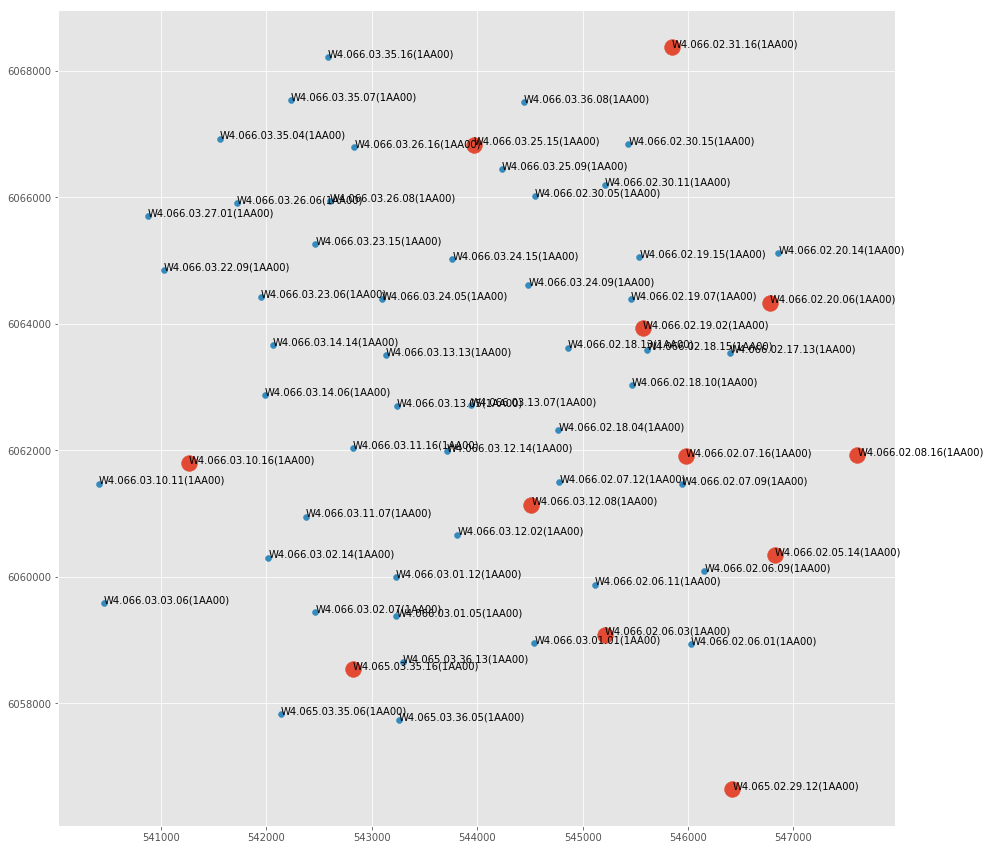

In [7]:
plt.figure(figsize=(15,15))

plt.scatter(xc12, yc12 , s=250)
for i, txt in enumerate(wells12):
    plt.annotate(txt, (xc12[i], yc12[i]))
    
plt.scatter(xc50, yc50)
for i, txt in enumerate(wells50):
    plt.annotate(txt, (xc50[i], yc50[i]))

plt.show()

#### Check data statistics:

In [8]:
data50.describe(include='all')

,CALI,DEPT,DRES,DT,FACIES_LUMPED_MODIFIED_AIB_1_5,GR,IP_CLST,IP_IB,IP_VSH,NPSS,PEF,PHIT_CLIP_ED,RHOB,SO_CALC_OVS,SP,SWT_CLIP_ED_OVS,S_W3_CLIP,WELL_NAME,Zone
count,20278.000000,20304.000000,20304.000000,20286.000000,13330.000000,20140.000000,12751.000000,12772.000000,12764.000000,20304.000000,20304.000000,20120.000000,20300.000000,19502.000000,20304.000000,19502.000000,15531.000000,20304,20304.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W4.066.02.06.09(1AA00),NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,583,NaN
mean,169.401643,472.628717,14.307421,403.658661,1.867667,65.275723,1.442874,21.359232,22.614091,0.445391,2.569501,0.308918,2114.765648,0.348202,-9.810370,0.651798,0.070632,NaN,4.839194
std,20.212771,21.587090,10.480491,32.504829,1.929171,10.231959,2.650897,27.434214,27.039902,0.056380,0.353362,0.064527,88.394095,0.276739,97.239328,0.276739,0.042098,NaN,2.143706
min,133.098999,417.125000,1.882300,0.000000,0.000000,37.743999,-10.000000,-10.000000,-20.000000,0.087149,0.127000,0.000000,1756.321045,0.000000,-668.000000,0.108300,0.000000,NaN,2.000000
25%,156.070934,456.748750,5.918450,396.780403,0.000000,58.592999,0.317937,1.419641,2.715049,0.428900,2.359000,0.299328,2064.792175,0.000000,-27.049500,0.391625,0.034000,NaN,3.000000
50%,159.996498,472.305000,10.844000,407.940247,1.000000,62.832600,0.796188,8.174965,10.336772,0.453100,2.469000,0.327125,2090.613403,0.390968,0.248000,0.609032,0.081000,NaN,6.000000
75%,172.647873,487.500000,21.375449,417.001511,4.000000,70.124002,1.779454,32.695383,34.072968,0.473515,2.660125,0.342896,2136.628540,0.608375,24.609500,1.000000,0.105000,NaN,7.000000


In [9]:
data12.describe()

,CALI,DEPT,DRES,DT,GR,NPSS,PEF,RHOB,SP
count,17321.000000,17321.000000,17321.000000,17321.000000,17321.000000,17321.000000,17321.000000,17321.000000,17321.000000
mean,161.637399,406.965667,11.046809,410.827855,70.246714,0.432102,2.401612,2121.788099,-36.272115
std,8.494023,51.346470,12.323858,30.900600,16.180799,0.049024,0.307040,92.612674,129.818593
min,134.985001,305.405000,1.912900,153.967300,24.228399,0.086930,1.411400,1497.003052,-434.309509
25%,156.313004,364.995000,5.121000,401.406494,58.096001,0.407100,2.204600,2056.615967,-25.381001
50%,160.784012,407.245000,6.447500,411.746002,67.498001,0.434906,2.399000,2101.588867,0.352000
75%,165.479904,449.478400,11.158000,421.489990,81.503098,0.460600,2.565000,2175.452881,25.536999
max,223.996994,536.346400,159.414093,668.539001,143.001907,0.971800,5.668000,2760.186768,77.780998


In [10]:
for idx, column in enumerate(columns50):
    print("The {} column is {}".format(idx, column))
    try:
        float_data = data50[column].astype(np.float)
        print(float_data.describe())
        print("The number of nan in column {} is {}".format(column, float_data.isnull().sum()))
        print("The min, max value are: {}, {}, respectively".format(float_data.min(), float_data.max()))
        print("The new min is {}".format(float_data[float_data>float_data.min()].min()))
        print("\n")
    except:
        print(data50[column].describe())
        print("\n")
        

The 0 column is CALI
count    20278.000000
mean       169.401643
std         20.212771
min        133.098999
25%        156.070934
50%        159.996498
75%        172.647873
max        267.290985
Name: CALI, dtype: float64
The number of nan in column CALI is 26
The min, max value are: 133.09899902, 267.29098511, respectively
The new min is 135.05900574


The 1 column is DEPT
count    20304.000000
mean       472.628717
std         21.587090
min        417.125000
25%        456.748750
50%        472.305000
75%        487.500000
max        532.250000
Name: DEPT, dtype: float64
The number of nan in column DEPT is 0
The min, max value are: 417.125, 532.25, respectively
The new min is 417.25


The 2 column is DRES
count    20304.000000
mean        14.307421
std         10.480491
min          1.882300
25%          5.918450
50%         10.844000
75%         21.375449
max         84.096397
Name: DRES, dtype: float64
The number of nan in column DRES is 0
The min, max value are: 1.88230001930000

##### Check depth interval, and number of data points per well, already checked the intervals are consistent across each individaul well

In [11]:
for w1 in wells50:
    dept = data50[data50['WELL_NAME'] == w1]['DEPT'].values
    dept_min = np.round(dept.min(),2)
    dept_max = np.round(dept.max(),2)
    dept_dt = np.round(dept[1]-dept[0],4)
    n = np.int(np.ceil(dept_max - dept_min) /dept_dt)
    print("Well {} is from {:2f} to {:2f}, with dt {:2f}, and {} data points".format(w1, 
                                                                                     dept_min, 
                                                                                     dept_max,
                                                                                     dept_dt,
                                                                                     n))

Well W4.065.03.35.06(1AA00) is from 431.120000 to 479.620000, with dt 0.125000, and 392 data points
Well W4.065.03.36.05(1AA00) is from 438.240000 to 486.040000, with dt 0.100000, and 480 data points
Well W4.065.03.36.13(1AA00) is from 433.370000 to 481.870000, with dt 0.125000, and 392 data points
Well W4.066.02.06.01(1AA00) is from 432.000000 to 489.880000, with dt 0.125000, and 464 data points
Well W4.066.02.06.09(1AA00) is from 425.400000 to 483.600000, with dt 0.100000, and 590 data points
Well W4.066.02.06.11(1AA00) is from 417.120000 to 476.120000, with dt 0.125000, and 472 data points
Well W4.066.02.07.09(1AA00) is from 435.900000 to 490.500000, with dt 0.099900, and 550 data points
Well W4.066.02.07.12(1AA00) is from 438.150000 to 493.930000, with dt 0.152400, and 367 data points
Well W4.066.02.17.13(1AA00) is from 449.280000 to 497.430000, with dt 0.152400, and 321 data points
Well W4.066.02.18.04(1AA00) is from 438.500000 to 488.130000, with dt 0.125000, and 400 data points


#### Plot Features, Zones, and Facies Side by Side per Well for All 50 Wells

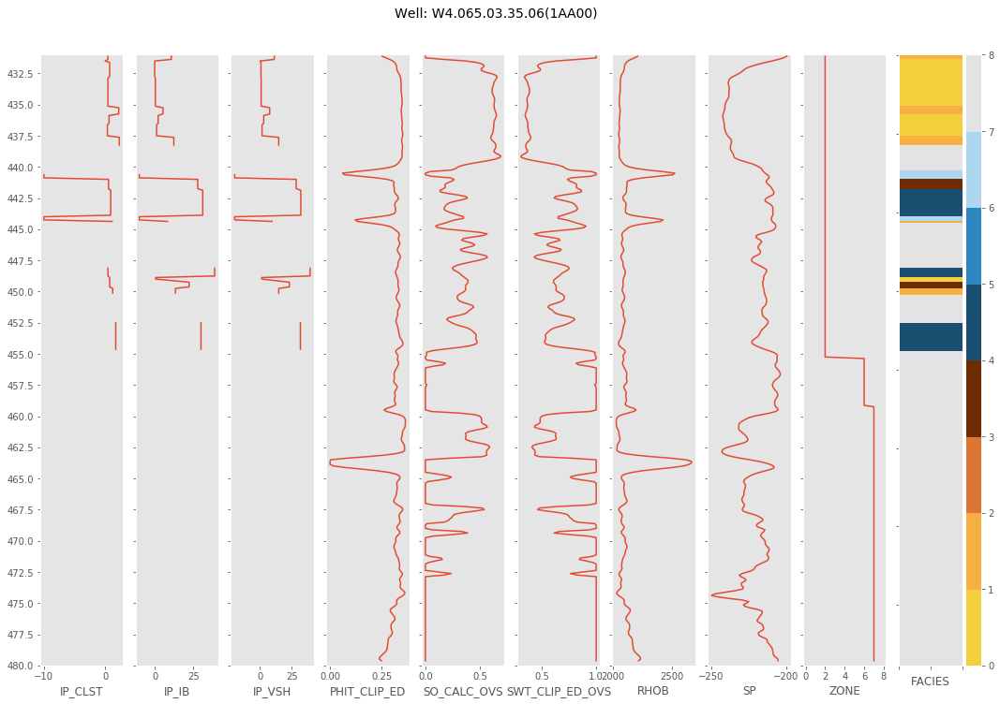

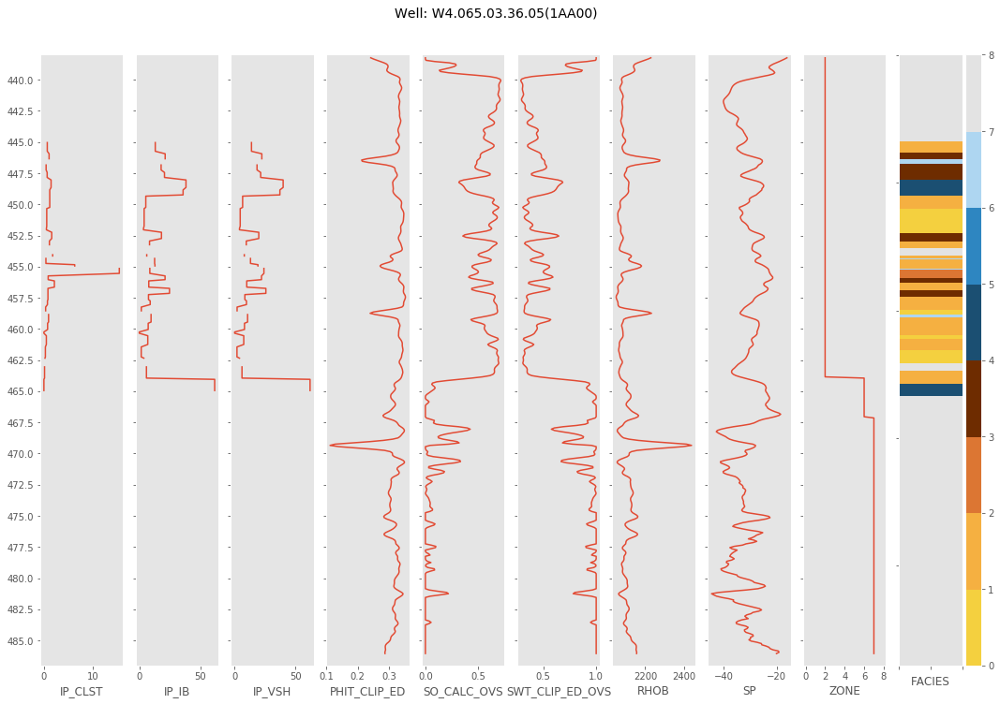

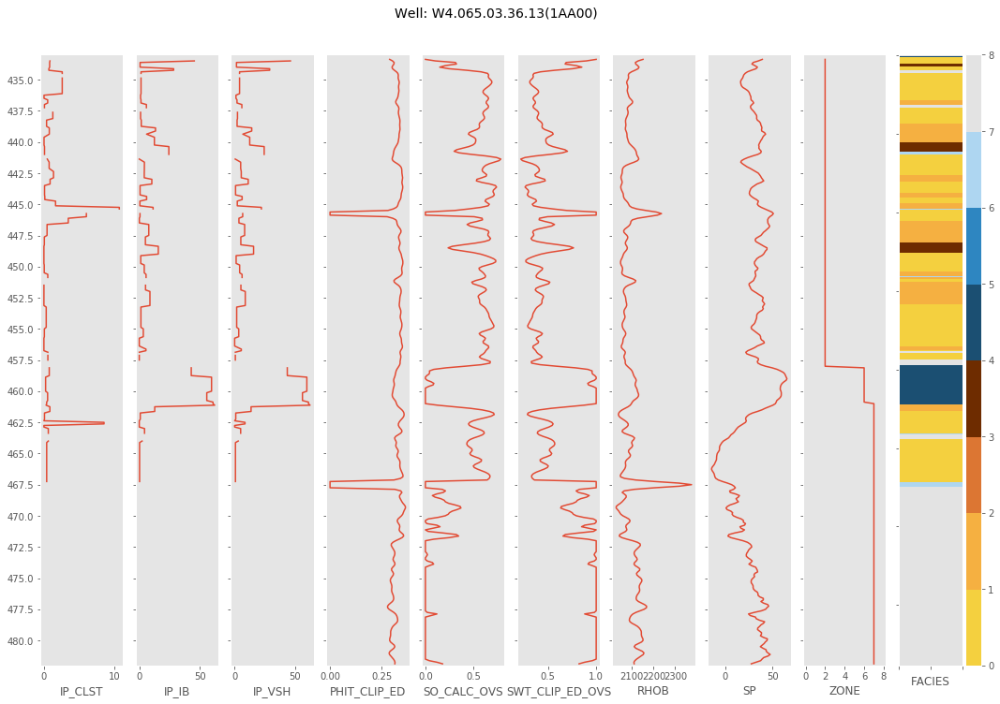

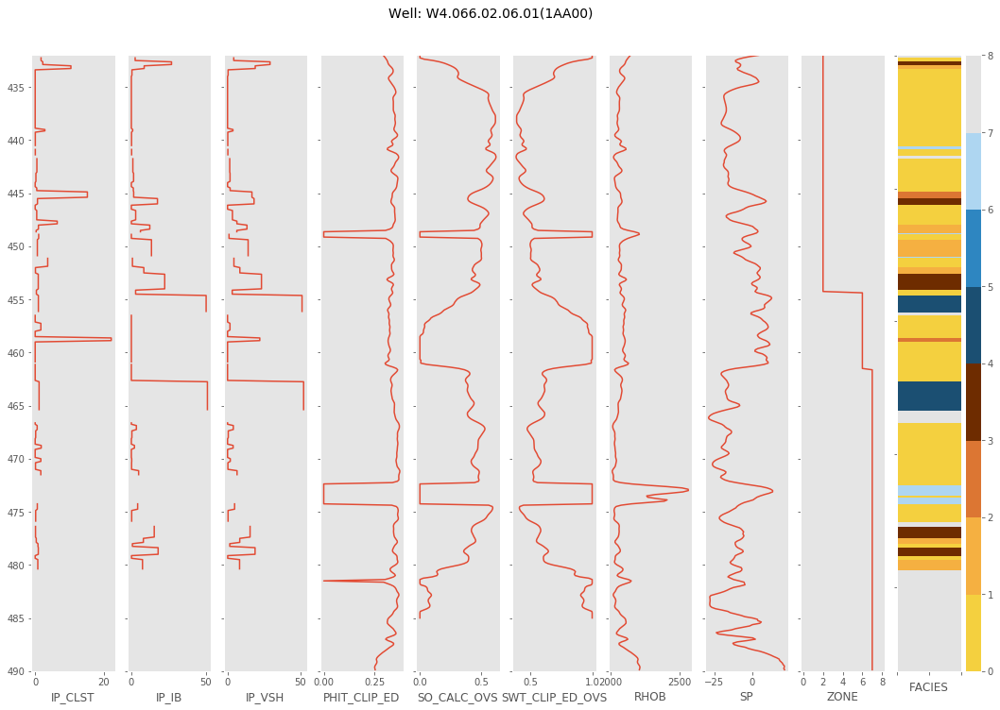

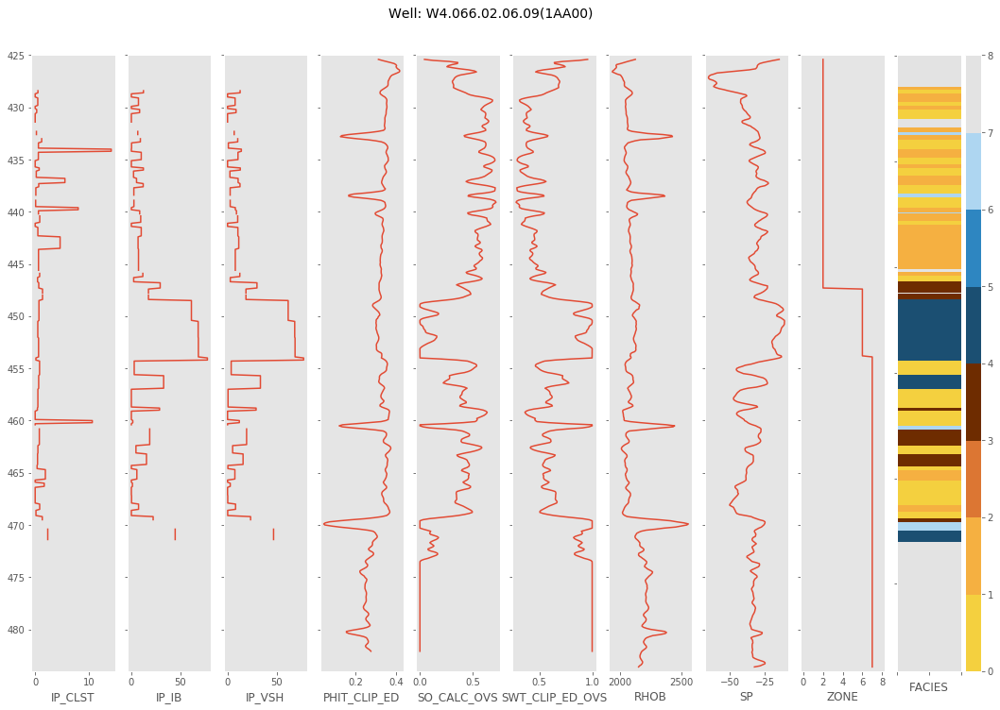

...

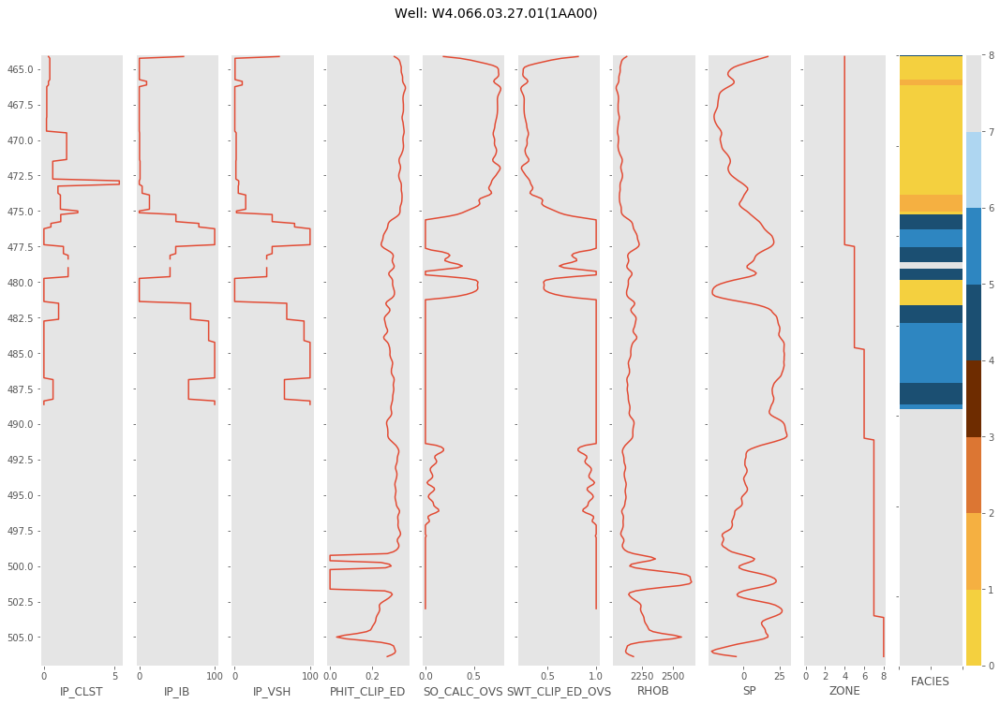

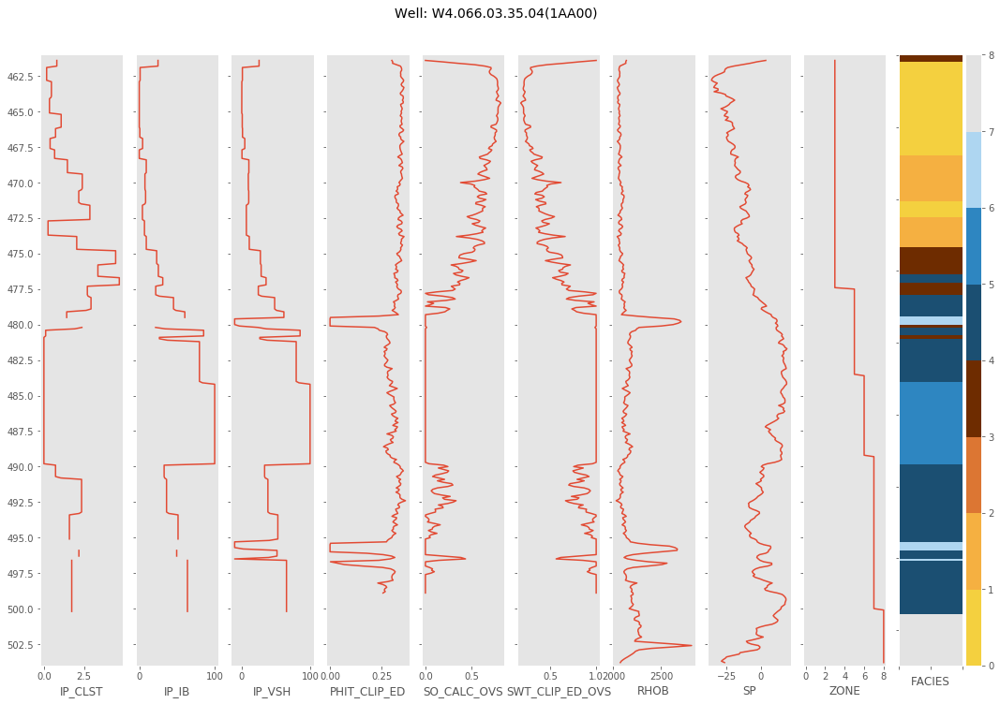

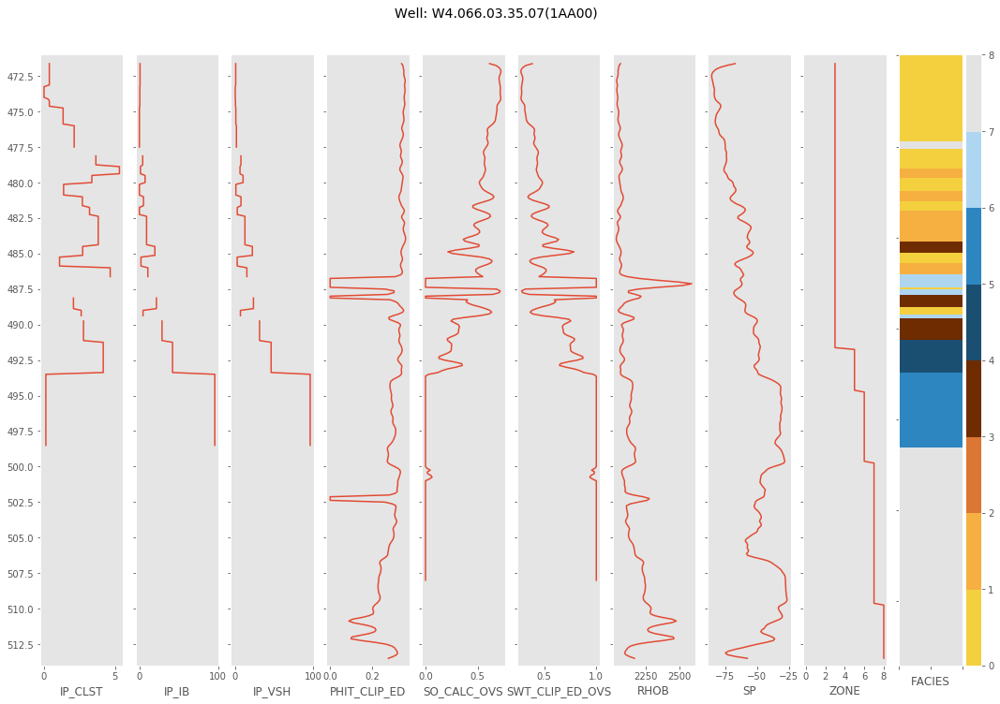

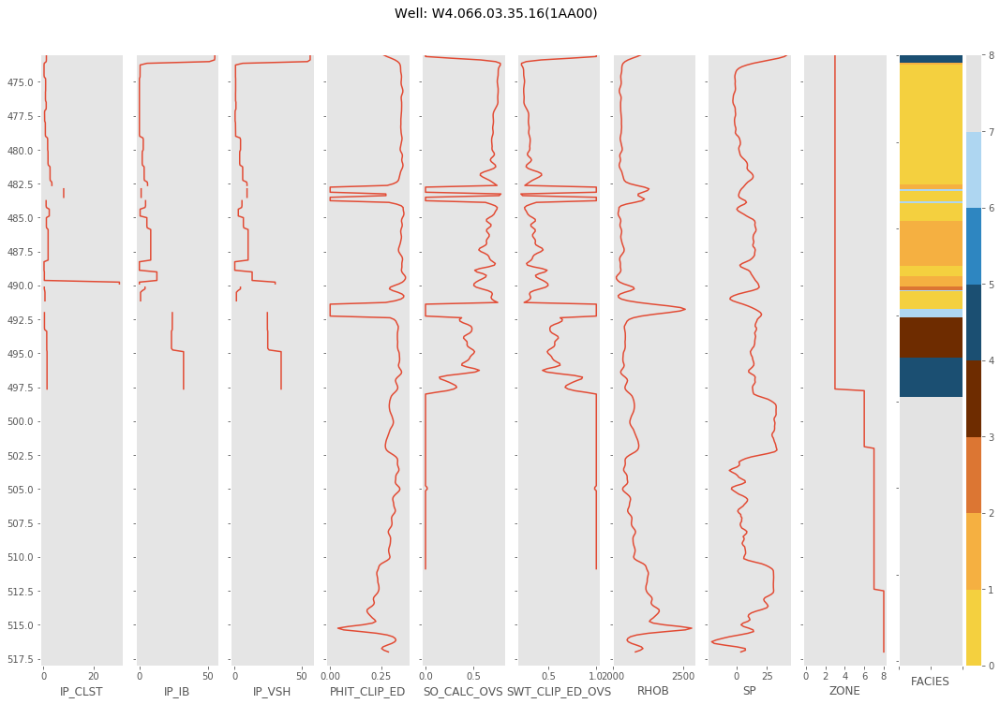

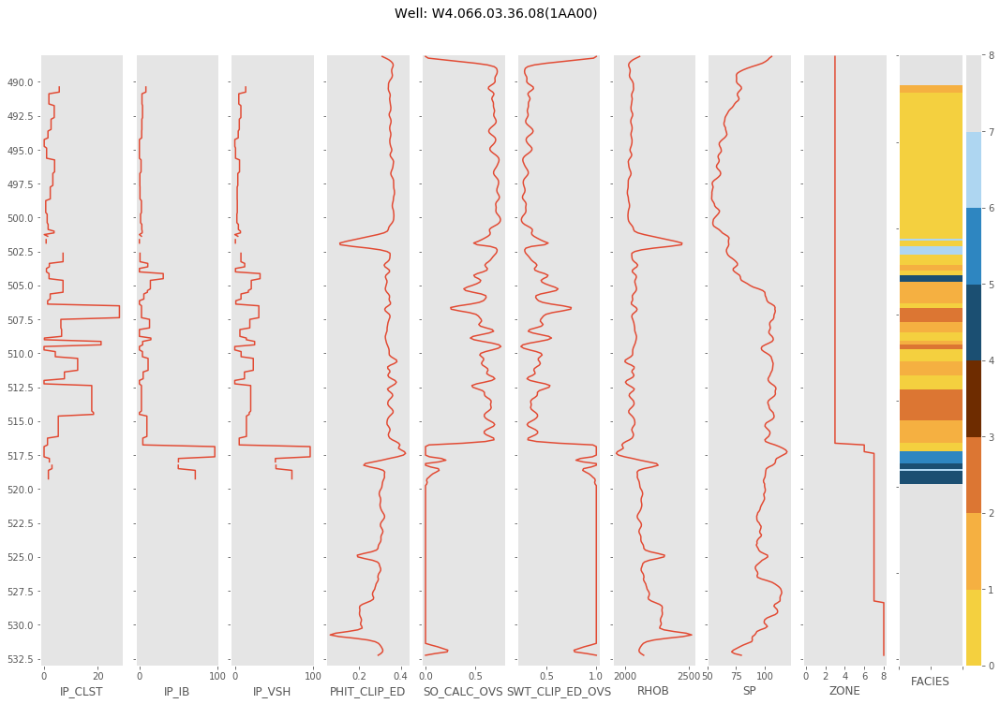

In [12]:
uc3.plot_w1_features(data50, 
               wells50, 
               columns = ['IP_CLST',  'IP_IB', 'IP_VSH', 'PHIT_CLIP_ED', 'SO_CALC_OVS', 'SWT_CLIP_ED_OVS', 'RHOB', 'SP', "Zone"], 
               )

## Train/Test/Predict using TPOT

Here we will use the tpot_train_test_New function defined in UC3_Functions.py, which trains models for all parameters using the 50 wells, and predicts the missing curves for the 12 wells.

Loops through all missing parameters, creates models for them and does prediction for all 12 wells, and saves the results in a csv file. It also saves the 
best performing method coming out of tpot, in a .py file. Prediction results are saved in Data12_Predictions.csv. There are 2 parameters that control how much tpot will run: gen = 5, pop =20. Increasing these will increase the amount of time that tpot will run and vice versa. The final results sent to XOM were run by gen = 10, pop =50. More information about TPOT method can be found at https://epistasislab.github.io/tpot/.



In [ ]:
targets = ['FACIES_LUMPED_MODIFIED_AIB_1_5','IP_IB','IP_VSH','PHIT_CLIP_ED','SO_CALC_OVS','SWT_CLIP_ED_OVS','S_W3_CLIP','Zone']
uc3.tpot_train_test_New(data50, data12, targets, gen = 5, pop =20, refine_zone = True)

## QC the results

Here we will load the predictions results, and will do cross-plots and well log plots for each 12 wells.

In [13]:
data_pred = pd.read_csv('Data12_Predictions_10_50.csv')
display(data_pred.head(20))

,CALI,DEPT,DRES,DT,GR,NPSS,PEF,RHOB,SP,WELL_NAME,...,IP_IB_Predicted,IP_VSH_Predicted,PHIT_CLIP_ED_Predicted,SO_CALC_OVS_Predicted,SWT_CLIP_ED_OVS_Predicted,S_W3_CLIP_Predicted,Zone_Predicted,Zone_Predicted_No_Filter,IP_CLST_Predicted,Facies_Rule_based
0,162.426987,310.495,2.952,444.269012,101.391998,0.48590,2.772,2238.346924,41.515999,W4.065.02.29.12(1AA00),...,85.057202,86.824736,0.235658,0.000010,0.999999,0.006737,2.0,2.0,1.767534,4.0
1,160.817993,310.620,3.000,433.447998,95.328003,0.47200,2.835,2240.957031,38.591999,W4.065.02.29.12(1AA00),...,89.290405,86.861169,0.233865,0.000010,0.999273,0.007806,2.0,2.0,0.000000,4.0
2,159.345993,310.745,3.046,424.691010,86.040001,0.45670,2.780,2211.113037,33.039001,W4.065.02.29.12(1AA00),...,88.123156,87.663690,0.252134,0.000010,0.999958,0.007516,2.0,2.0,0.000000,4.0
3,158.882004,310.870,3.099,420.815002,76.925003,0.44220,2.641,2157.897949,20.866999,W4.065.02.29.12(1AA00),...,84.631148,78.875562,0.285317,0.000071,0.999885,0.013111,2.0,2.0,0.000000,4.0
4,158.974014,310.995,3.168,422.074005,69.913002,0.42805,2.478,2102.641113,8.822000,W4.065.02.29.12(1AA00),...,74.782482,71.667601,0.319095,-0.000517,0.996441,0.014438,2.0,2.0,0.000000,4.0
5,159.112000,311.120,3.259,424.683990,65.507004,0.41610,2.354,2066.358887,1.794000,W4.065.02.29.12(1AA00),...,65.548093,69.602254,0.340469,0.004568,0.965207,0.012085,2.0,2.0,4.054162,4.0
6,159.342010,311.245,3.375,425.208008,64.313004,0.40625,2.286,2055.468018,-2.362000,W4.065.02.29.12(1AA00),...,60.441013,68.575052,0.348377,0.027745,0.937798,0.011706,2.0,2.0,8.134039,4.0
7,159.159012,311.370,3.515,423.346008,65.473999,0.39950,2.294,2064.480957,-3.474000,W4.065.02.29.12(1AA00),...,67.807607,71.448260,0.343593,0.004581,0.962129,0.012691,2.0,2.0,3.640653,4.0
8,159.569992,311.495,3.675,420.389008,67.596001,0.39430,2.341,2077.013916,-1.051000,W4.065.02.29.12(1AA00),...,71.202217,75.517501,0.335235,-0.014101,0.966363,0.012035,2.0,2.0,4.315284,4.0
9,159.665009,311.620,3.853,418.903992,68.964996,0.40290,2.400,2067.950928,5.203000,W4.065.02.29.12(1AA00),...,63.705735,74.949241,0.341011,-0.001923,0.995985,0.010145,2.0,2.0,11.243506,4.0


#### Cross Plots:

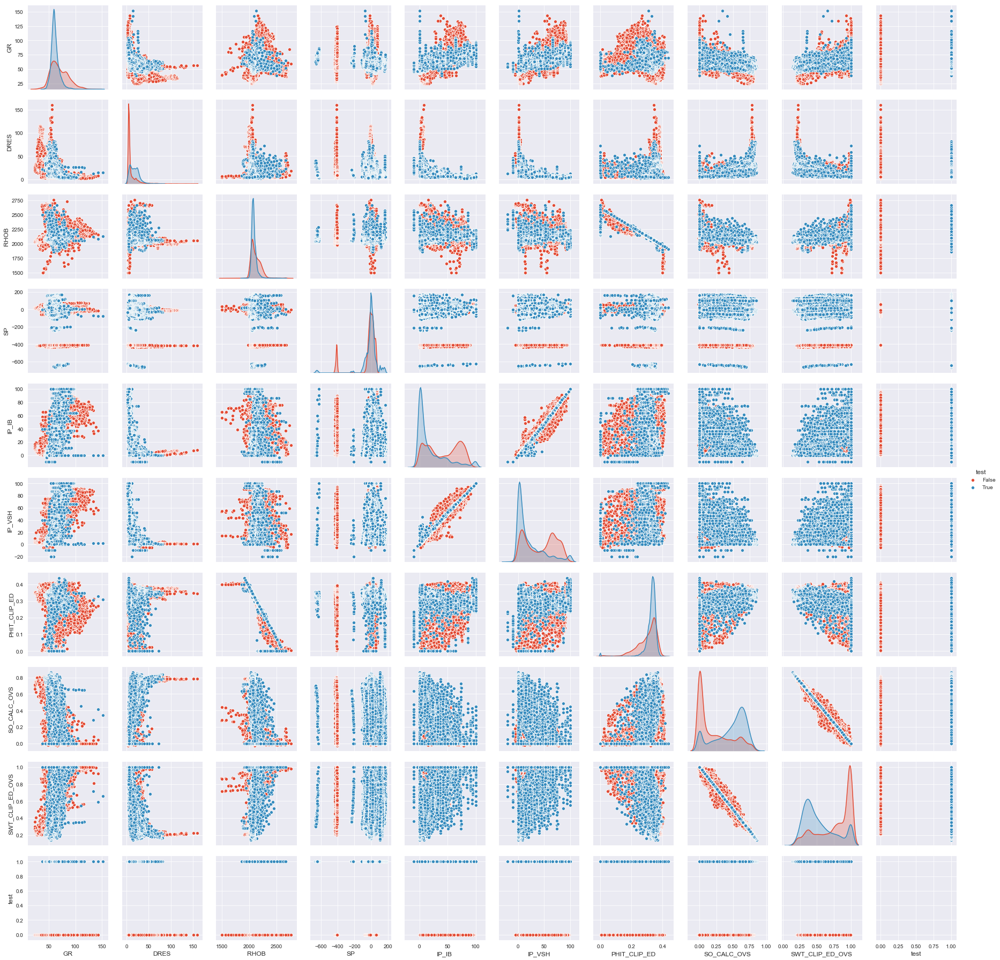

In [21]:
sns.set_style("darkgrid")

cols = ['GR','DRES', 'RHOB', 'SP','IP_IB','IP_VSH','PHIT_CLIP_ED','SO_CALC_OVS', 'SWT_CLIP_ED_OVS']

data50_na = data50.dropna()
data_pred_na = data_pred
data_pred_na.rename(columns={'IP_IB_Predicted': 'IP_IB'}, inplace=True)
data_pred_na.rename(columns={'IP_VSH_Predicted': 'IP_VSH'}, inplace=True)
data_pred_na.rename(columns={'PHIT_CLIP_ED_Predicted': 'PHIT_CLIP_ED'}, inplace=True)
data_pred_na.rename(columns={'SO_CALC_OVS_Predicted': 'SO_CALC_OVS'}, inplace=True)
data_pred_na.rename(columns={'SWT_CLIP_ED_OVS_Predicted': 'SWT_CLIP_ED_OVS'}, inplace=True)

data50_na['test'] = True
data_pred_na['test'] = False
both = pd.concat([data50_na[cols + ['test']], data_pred_na[cols + ['test']].dropna()],0)
sns.pairplot(both, hue='test')

#### Log Plots:

In [21]:
data12pred = pd.read_csv('Data12_Predictions_10_50.csv')

newcol = ['CALI', 'DEPT', 'DRES', 'DT', 'GR', 'NPSS', 'PEF', 'RHOB', 'SP',
       'WELL_NAME', 'FACIES_LUMPED_MODIFIED_AIB_1_5_Predicted',
       'IP_IB_Predicted', 'IP_VSH_Predicted', 'IP_CLST_Predicted', 
       'SO_CALC_OVS_Predicted', 'SWT_CLIP_ED_OVS_Predicted',
       'S_W3_CLIP_Predicted', 'Facies_Rule_based','PHIT_CLIP_ED_Predicted',
       'Zone_Predicted_No_Filter','Zone_Predicted']

data12pred = data12pred[newcol]
data12pred.describe()
columns12 = data12pred.columns
print(columns.size)

21


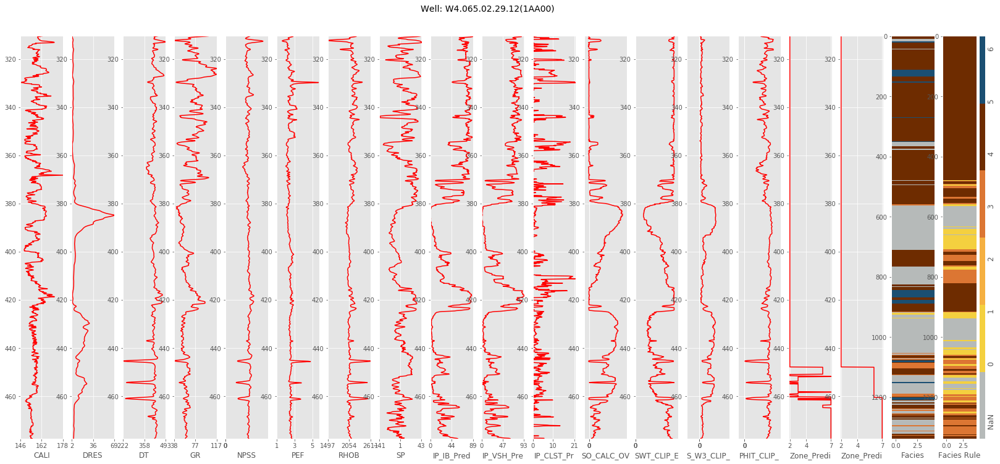

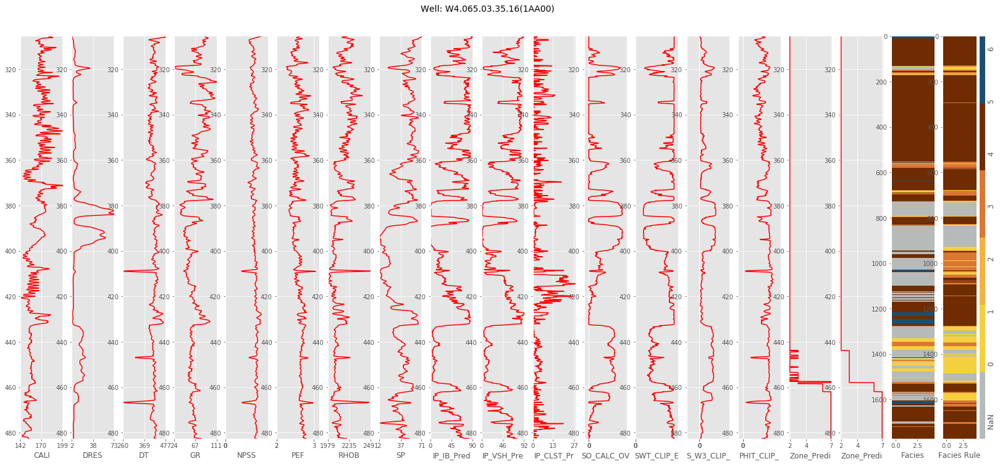

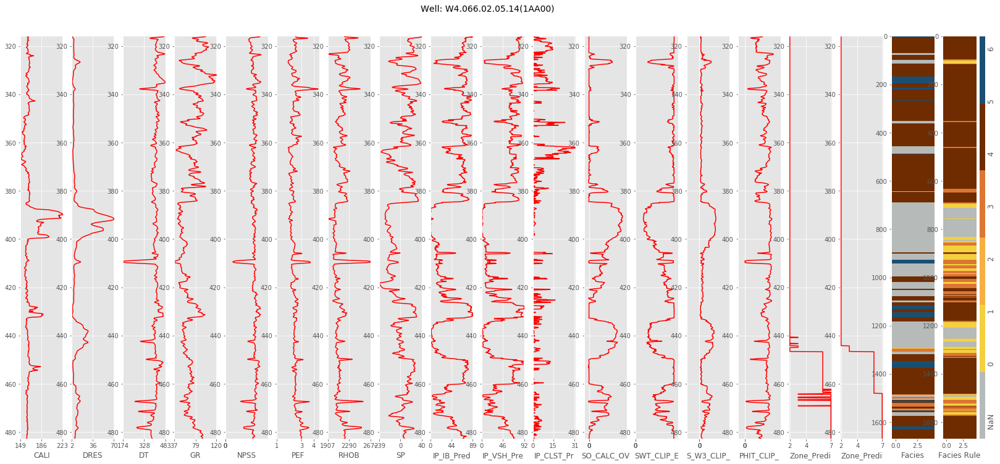

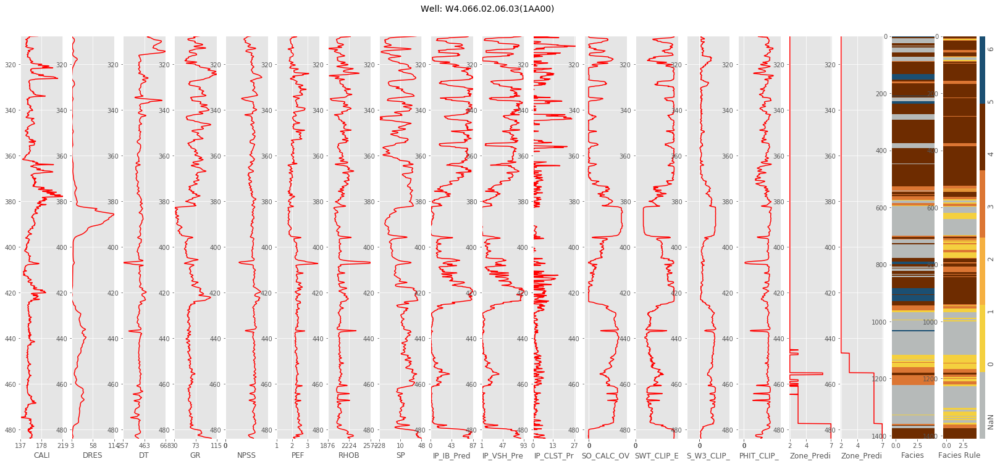

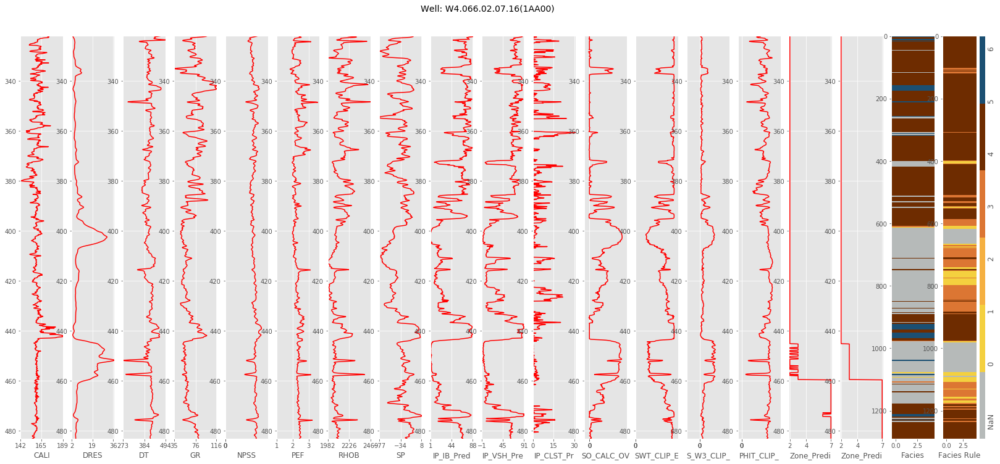

...

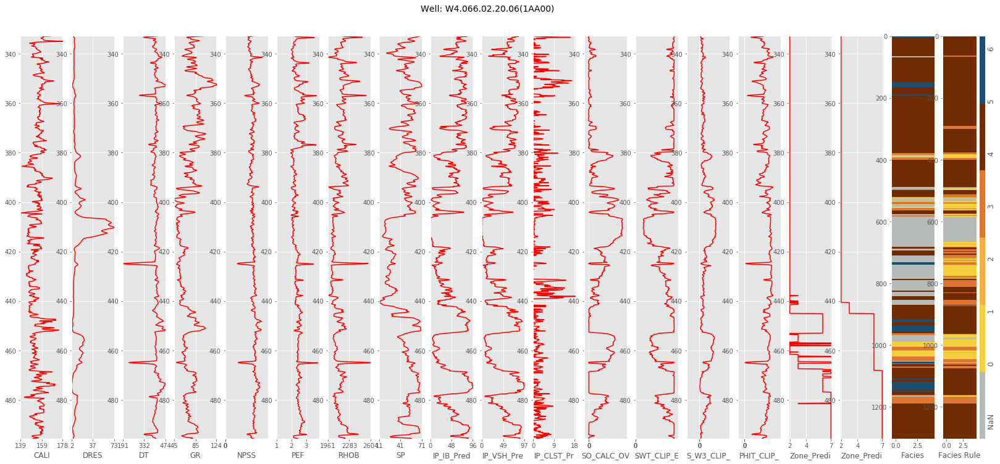

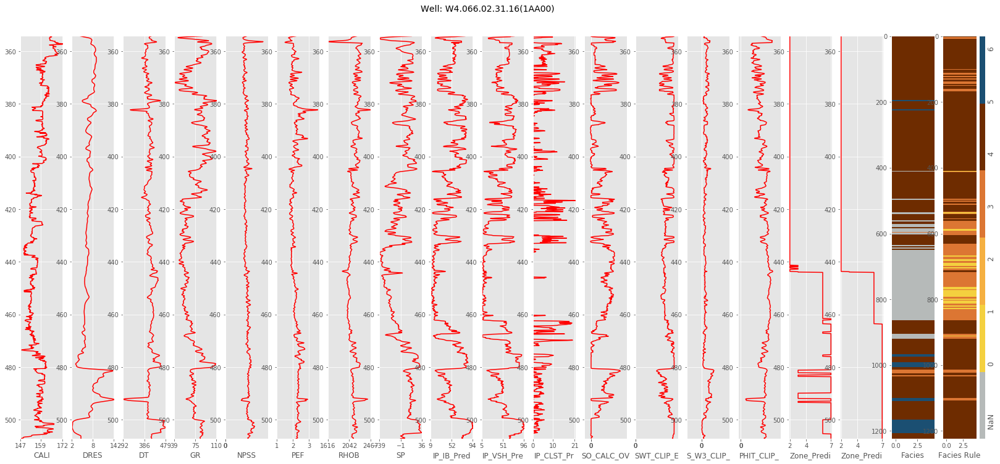

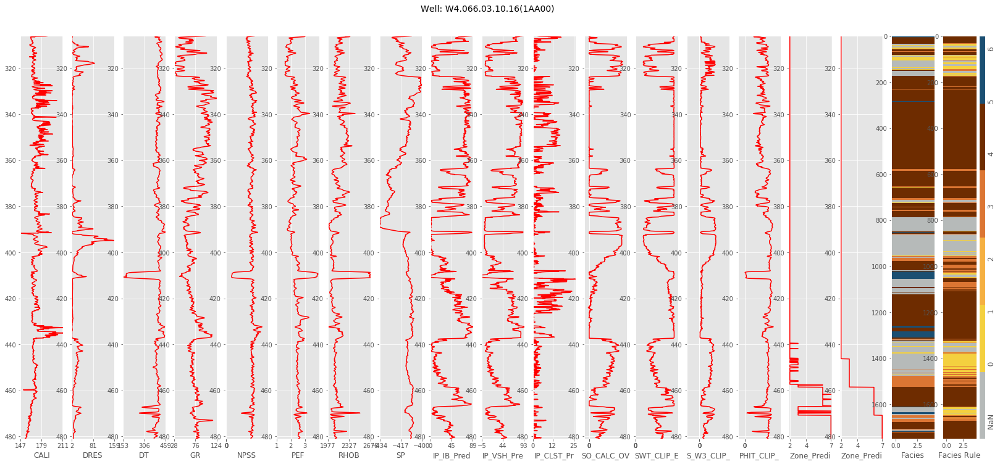

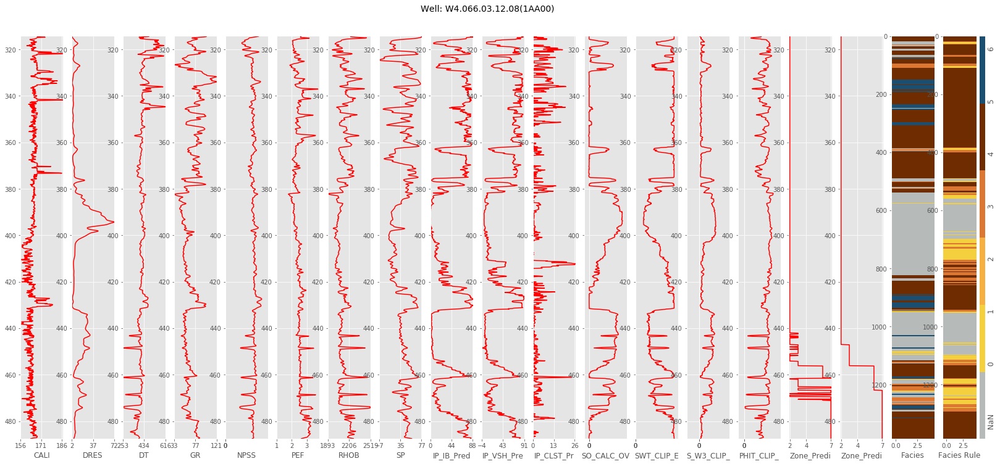

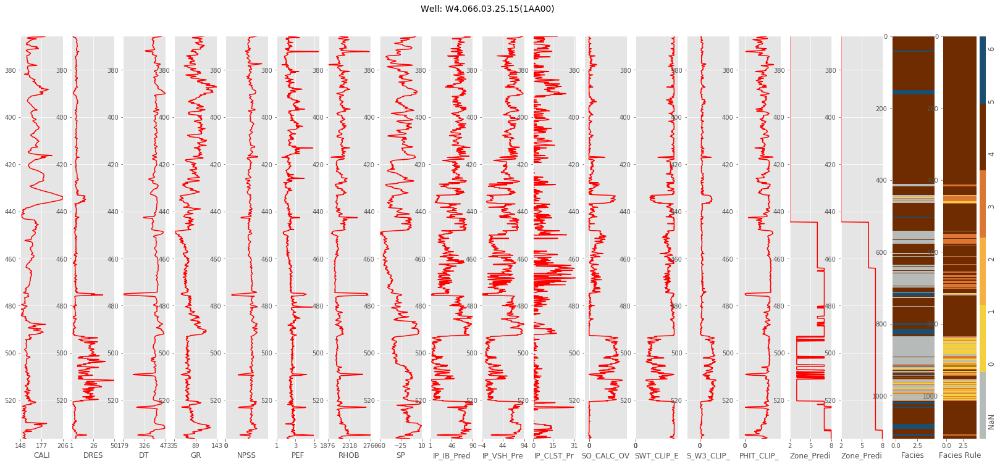

In [23]:
for well_name in wells12:
    one_well = data12pred[data12pred['WELL_NAME'] == well_name]
    uc3.make_pred_log_plot(one_well,columns12, depth_idx, facies_idx,faciesR_idx,facies_colors,facies_counts)

## Appendix


### Feature removing  using XGB

Running this section will determine which features should be removed. The number of features to be removed is determined by "natt" parameter.

In [39]:
natt = 1   # This is the number of features to remove from inputs. 

atts=set(itertools.combinations(['SP', 'PEF', 'DT', 'DRES', 'RHOB', 'GR','DEPT', 'CALI','NPSS'], natt))

targets = ['FACIES_LUMPED_MODIFIED_AIB_1_5','IP_CLST','IP_IB','IP_VSH','PHIT_CLIP_ED','SO_CALC_OVS','SWT_CLIP_ED_OVS','S_W3_CLIP','Zone']

with open('remove'+'_'+str(natt)+'.txt', "w") as afile:
    for target in targets:
        afile.write('======================================================================================================'+'\n')
        afile.write('Target is:'+'\n')
        afile.write(target+'\n')
        afile.write('======================================================================================================'+'\n')

        print('======================================================================================================')
        print('                                   Target is:    ', target)
        print('======================================================================================================')
        for att in atts:
            print('Removed curves:    ', att)
            afile.write('#################'+'\n')
            afile.write('Removed curves :'+'\n')
            afile.write(str(att)+'\n\n')
            afile.write('Average accuracy :'+'\n')
            [cor,mean_cor] = xgb_train_test(data50, data12, survey50, wells12, 49, 1, target, list(att), include = False)
            afile.write(str(mean_cor)+'\n')
            afile.write('\n\n\n\n')
            afile.write('#################'+'\n')


                                   Target is:     FACIES_LUMPED_MODIFIED_AIB_1_5
Removed curves:     ('PEF',)
F1 score:      [0.5594594594594594, 0.7099236641221375, 0.5404761904761904, 0.536741214057508, 0.5990783410138248, 0.5990783410138248, 0.729665071770335, 0.6485714285714286, 0.3316831683168317, 0.49226006191950467, 0.6035714285714285, 0.5758928571428571]
average F1 score:     .  0.5772001022029442
Removed curves:     ('SP',)
F1 score:      [0.5513513513513514, 0.7595419847328244, 0.5952380952380952, 0.5686900958466453, 0.5944700460829493, 0.5944700460829493, 0.6985645933014354, 0.6571428571428571, 0.35148514851485146, 0.5386996904024768, 0.6285714285714286, 0.5178571428571429]
average F1 score:     .  0.5880068733437506
                                   Target is:     IP_CLST
Removed curves:     ('PEF',)
corcoefs== .  [-0.02791752930287455, 0.01657728118837863, 0.09909623042496295, -0.0426811340135138, 0.07457180843636597, 0.07457180843636597, 0.0017007421674201616, 0.45884150